In [1]:
import os, warnings
import dicom
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import collections
import xml.etree.ElementTree as ET

from pylab import *
from mpl_toolkits.mplot3d.axes3d import Axes3D

from scipy import ndimage as ndi

from skimage.morphology import watershed
from skimage.feature import peak_local_max

NS = {'nih': 'http://www.nih.gov'}
lidc_path = "../test-images/"
verbose = True

class LidcSeries:
    patient =""
    study=""
    series=""
    folder_path=""
    xml_path=""
    dicom_image_paths=[]
    
    def set_xml_info(self,xml_info):
        self.xml_info = xml_info
    def set_image_paths(self,image_paths):
        self.dicom_image_paths = image_paths
    def __str__(self):
        return folder_path
    
    def read_dicom_image(self, position):
        with open(self.dicom_image_paths[position], 'rb') as f:
            return dicom.read_file(f)
        


def get_dicom_paths(path_study):
    folders = []
    for folder_item in os.listdir(path_study):
        if folder_item.endswith('.dcm'):
            path_to_dicom = os.path.join(path_study, folder_item)
            folders.append(path_to_dicom )
    return folders
    
def get_xml_path(path_study):
    for folder_item in os.listdir(path_study):
        if folder_item.endswith('.xml'):
            return os.path.join(path_study, folder_item)

def load_series(lidc_path):
    """
    Load all the DICOM images assocated with this scan and return as list.

    Example:
        >>> scan = pl.query(pl.Scan).first()
        >>> images = scan.load_all_dicom_images()
        >>> zs = [float(img.ImagePositionPatient[2]) for img in images]
        >>> print(zs[1] - zs[0], img.SliceThickness, scan.slice_thickness)
        >>>
        >>> import matplotlib.pyplot as plt
        >>> plt.imshow( images[0].pixel_array, cmap=plt.cm.gray )
        >>> plt.show()
    """
    if verbose: print("Loading dicom files ... This may take a moment.")

    path = lidc_path
    
    #"/patient_id/study_instance_uid/series_instance_uid"
    all_series = []
    
    for patient in os.listdir(path):
        for study in os.listdir(os.path.join(path,patient)):
            for series in os.listdir(os.path.join(path, patient, study)):
                lidcSerie = LidcSeries()
                current_path = os.path.join(path, patient, study, series)
                folders = get_dicom_paths(current_path)        
                xml_path = get_xml_path(current_path)        

                lidcSerie.patient = patient
                lidcSerie.study = study
                lidcSerie.series = series
                lidcSerie.xml_path = xml_path
                lidcSerie.folder_path=current_path
                lidcSerie.set_image_paths(folders)
                all_series.append(lidcSerie)
    
    if verbose: print("Series Count: " + str(len(all_series)))
    
    if verbose: print len(all_series[0].dicom_image_paths)
    if verbose: print len(all_series[1].dicom_image_paths)
    
    return all_series


series = load_series(lidc_path)

Loading dicom files ... This may take a moment.
Series Count: 3
246
2


## Parse XML 138

In [3]:
print series[0].xml_path
print series[2].xml_path

#parse xml
current_series = series[2]
xml_path = current_series.xml_path
xml_info = parse_xml_file(xml_path)
current_series.set_xml_info(xml_info)
#print current_series.xml_info.header
print current_series.xml_info.annotations
print "###################"
print current_series.xml_info.annotations[0]
print "###################"
print current_series.xml_info.annotations[1]
print "###################"
print current_series.xml_info.annotations[2]
print "###################"
print current_series.xml_info.annotations[3]


../test-images/LIDC-IDRI-0476/1.3.6.1.4.1.14519.5.2.1.6279.6001.837252783245693412667023877670/1.3.6.1.4.1.14519.5.2.1.6279.6001.250397690690072950000431855143/220.xml
../test-images/LIDC-IDRI-0181/1.3.6.1.4.1.14519.5.2.1.6279.6001.150188222462440903489565305064/1.3.6.1.4.1.14519.5.2.1.6279.6001.243094273518213382155770295147/117.xml
[<__main__.RadAnnotation instance at 0x7ff8b038fef0>, <__main__.RadAnnotation instance at 0x7ff8b03b9ab8>, <__main__.RadAnnotation instance at 0x7ff8b0359c20>, <__main__.RadAnnotation instance at 0x7ff8b1115cf8>]
###################
Annotation Version [3.12] Radiologist ID [anon] 
#Nodules [8] #NonNodules[6] 
--- Nodules [8]---
--- Nodule ID (128173) Small [False] ---
subtlty (5) intstruct (1) calci (6) sphere (4) margin (4) lob (4) spicul (2) txtur (5) malig (3)
Inclusion (True) Z = -217.25 SOP_UID (1.3.6.1.4.1.14519.5.2.1.6279.6001.833496245254565559776604385800) 
 ROI points [ 16 ]  ::  [[ 312,329 ]] :: (314, 332), (315,331)...(313, 332), (314,332)
Incl

## Run Sample

In [4]:
def sample_stack_z(stack, rows=4, cols=4, start_with=30, show_every=5):
    fig,ax = plt.subplots(rows,cols,figsize=(17,15))
    for i in range(rows*cols):
        ind = start_with + i*show_every
        ax[int(i/rows),int(i % rows)].set_title('slice %d' % ind)
        ax[int(i/rows),int(i % rows)].imshow(stack[:,:,ind], cmap=plt.cm.bone, interpolation='hanning', aspect='auto')
        ax[int(i/rows),int(i % rows)].axis('off')
    plt.show()


def sample_stack_y(stack, rows=4, cols=4, start_with=150, show_every=15):
    fig,ax = plt.subplots(rows,cols,figsize=(17,15))
    for i in range(rows*cols):
        ind = start_with + i*show_every
        ax[int(i/rows),int(i % rows)].set_title('slice %d' % ind)
        ax[int(i/rows),int(i % rows)].imshow(np.rot90(stack[:,ind,:]), cmap=plt.cm.bone, interpolation='hanning', aspect='auto')
        ax[int(i/rows),int(i % rows)].axis('off')
    plt.show()

def sample_stack_x(stack, rows=4, cols=4, start_with=150, show_every=15):
    fig,ax = plt.subplots(rows,cols,figsize=(17,15))
    for i in range(rows*cols):
        ind = start_with + i*show_every
        ax[int(i/rows),int(i % rows)].set_title('slice %d' % ind)
        ax[int(i/rows),int(i % rows)].imshow(np.rot90(stack[ind,:,:]), cmap=plt.cm.bone, interpolation='hanning', aspect='auto')
        ax[int(i/rows),int(i % rows)].axis('off')
    plt.show()

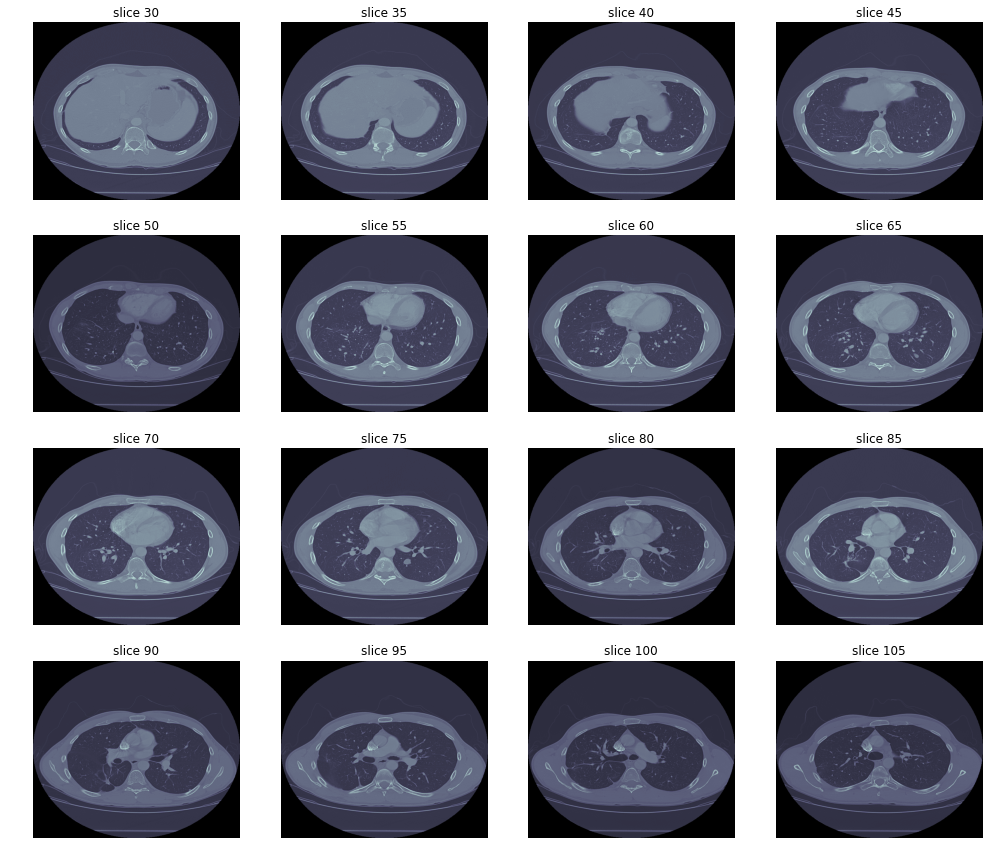

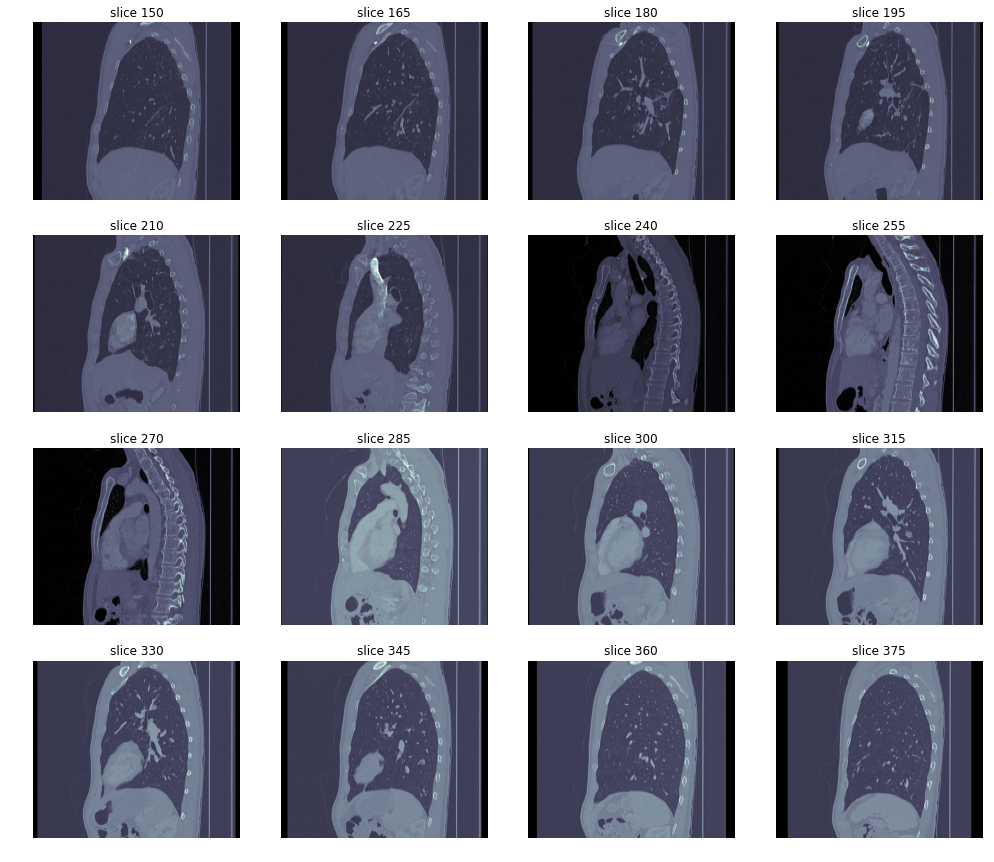

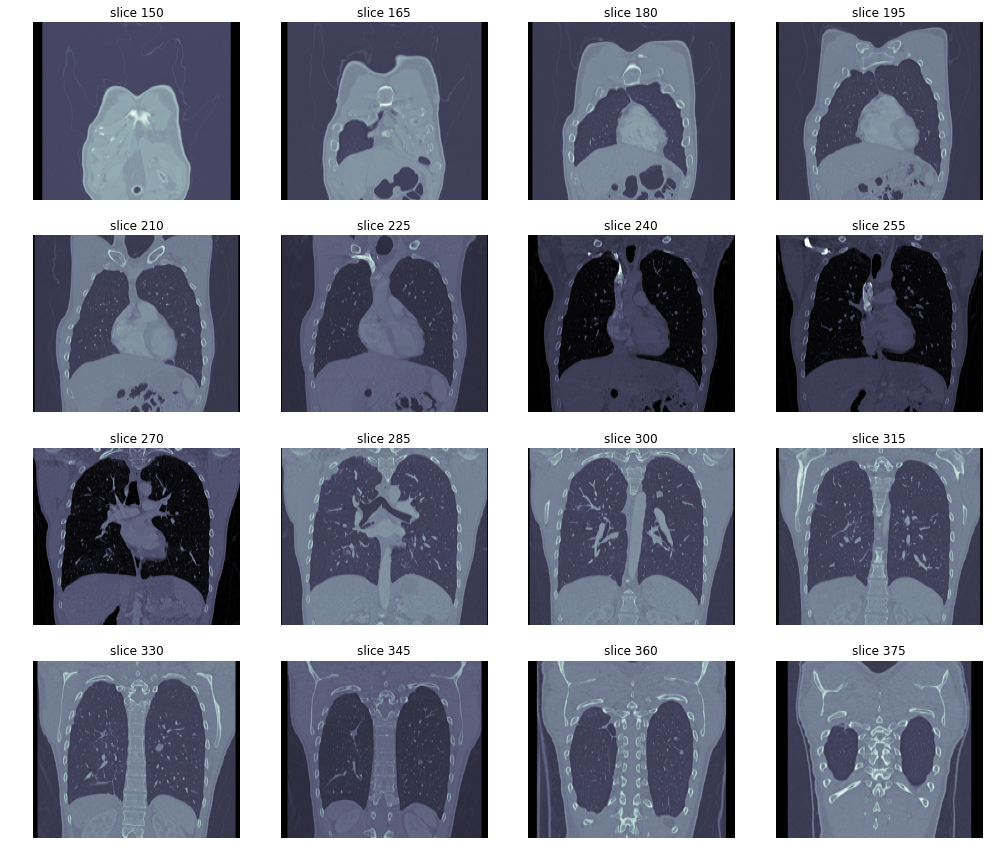

In [5]:
# Calculate dimensions
first_image_path = current_series.dicom_image_paths[0]
RefDs = dicom.read_file(first_image_path)
len_lstFilesDCM = len(current_series.dicom_image_paths)
ConstPixelDims = (int(RefDs.Rows), int(RefDs.Columns), len_lstFilesDCM)
ConstPixelSpacing = (float(RefDs.PixelSpacing[0]), float(RefDs.PixelSpacing[1]), float(RefDs.SliceThickness))

x = np.arange(0.0, (ConstPixelDims[0]+1)*ConstPixelSpacing[0], ConstPixelSpacing[0])
y = np.arange(0.0, (ConstPixelDims[1]+1)*ConstPixelSpacing[1], ConstPixelSpacing[1])
z = np.arange(0.0, (ConstPixelDims[2]+1)*ConstPixelSpacing[2], ConstPixelSpacing[2])


# Load 3D image indexed by axis
dictionary_by_location = {}

for i in range (0,len(current_series.dicom_image_paths)):
    ds = current_series.read_dicom_image(i)
    dictionary_by_location[ds.SliceLocation] = ds

ordered_dict = collections.OrderedDict(sorted(dictionary_by_location.items()))

ArrayDicom = np.zeros(ConstPixelDims, dtype=RefDs.pixel_array.dtype)
ind = 0
for key, value in ordered_dict.items():
    ArrayDicom[:, :, ind] = value.pixel_array
    ind+=1

sample_stack_z(ArrayDicom)
sample_stack_y(ArrayDicom)
sample_stack_x(ArrayDicom)


## Zoom in some images

(512, 512, 150)
353 356 61
354 355 61
354 354 61
354 353 61
354 352 61
354 351 61
353 350 61
352 349 61
351 348 61
350 347 61
350 346 61
349 345 61
348 344 61
347 344 61
346 344 61
345 344 61
344 345 61
344 346 61
344 347 61
344 348 61
344 349 61
345 350 61
346 351 61
346 352 61
347 352 61
348 353 61
349 354 61
350 355 61
351 356 61
352 356 61
353 356 61
346 347 61
347 346 61
348 346 61
349 346 61
349 347 61
350 348 61
350 349 61
351 350 61
352 351 61
352 352 61
352 353 61
351 353 61
351 354 61
350 354 61
349 354 61
348 353 61
347 352 61
346 351 61
345 350 61
345 349 61
345 348 61
346 347 61


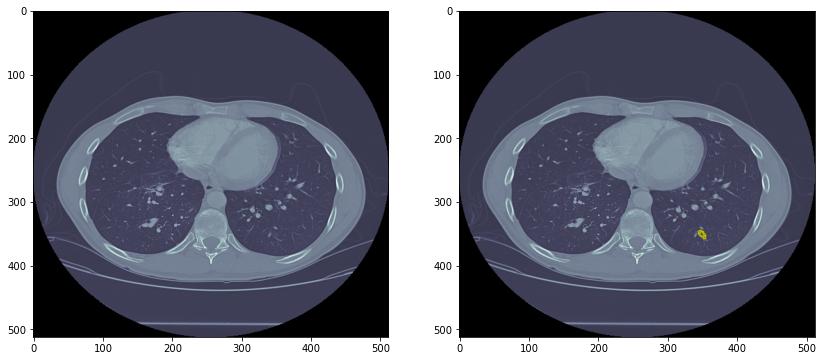

350 358 62
351 357 62
352 357 62
353 356 62
353 355 62
354 354 62
355 353 62
354 352 62
354 351 62
354 350 62
353 349 62
352 348 62
351 347 62
350 346 62
349 345 62
348 344 62
347 344 62
346 344 62
345 344 62
344 344 62
343 343 62
342 343 62
341 343 62
340 344 62
339 345 62
339 346 62
339 347 62
339 348 62
339 349 62
339 350 62
339 351 62
340 352 62
341 352 62
342 353 62
343 354 62
344 355 62
345 356 62
346 356 62
347 357 62
348 358 62
349 358 62
350 358 62
344 343 62
345 343 62
346 343 62
347 344 62
348 344 62
349 345 62
350 345 62
351 346 62
352 347 62
353 348 62
353 349 62
354 350 62
354 351 62
354 352 62
354 353 62
354 354 62
354 355 62
354 356 62
353 357 62
352 357 62
351 357 62
350 357 62
349 356 62
348 355 62
348 354 62
347 354 62
346 353 62
345 352 62
344 351 62
344 350 62
344 349 62
344 348 62
344 347 62
344 346 62
344 345 62
344 344 62
344 343 62
343 343 62
342 344 62
342 345 62
342 346 62
342 347 62
343 348 62
343 349 62
344 350 62
345 351 62
345 352 62
346 353 62
346 354 62

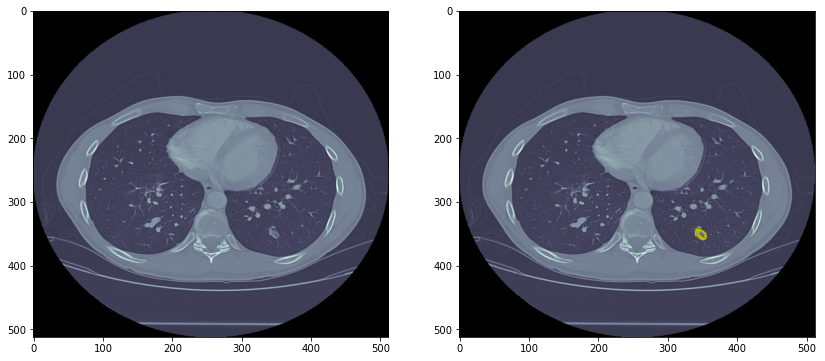

350 359 63
351 358 63
352 357 63
353 356 63
353 355 63
354 354 63
354 353 63
354 352 63
354 351 63
354 350 63
354 349 63
353 348 63
353 347 63
352 346 63
351 345 63
350 344 63
349 343 63
348 343 63
347 342 63
346 342 63
345 342 63
344 343 63
343 343 63
342 344 63
341 344 63
340 345 63
339 346 63
339 347 63
339 348 63
339 349 63
339 350 63
340 351 63
341 352 63
341 353 63
342 354 63
343 355 63
344 356 63
345 356 63
346 357 63
347 357 63
348 358 63
349 359 63
350 359 63
344 342 63
345 343 63
346 343 63
347 343 63
348 343 63
349 343 63
349 344 63
350 345 63
351 346 63
352 346 63
352 347 63
353 347 63
353 348 63
354 349 63
355 350 63
355 351 63
355 352 63
355 353 63
354 354 63
353 355 63
353 356 63
352 357 63
351 357 63
351 358 63
350 358 63
349 358 63
348 357 63
347 357 63
346 356 63
345 356 63
344 356 63
344 355 63
343 354 63
342 353 63
341 353 63
341 352 63
340 351 63
340 350 63
340 349 63
340 348 63
340 347 63
340 346 63
340 345 63
340 344 63
340 343 63
341 343 63
342 343 63
342 342 63

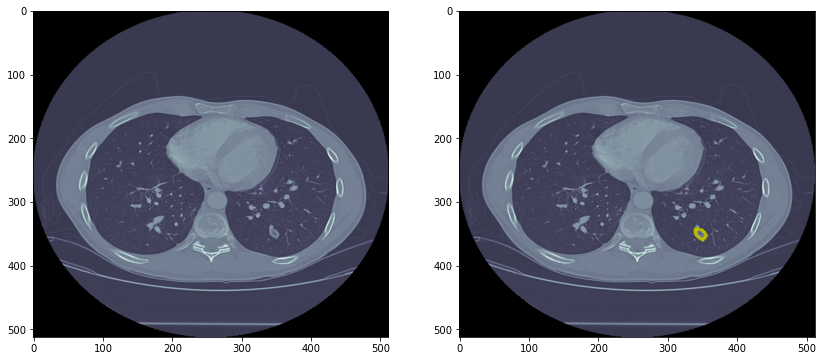

351 357 64
352 356 64
353 355 64
353 354 64
354 353 64
354 352 64
354 351 64
354 350 64
354 349 64
353 348 64
353 347 64
352 346 64
351 345 64
350 345 64
349 344 64
348 343 64
347 342 64
346 342 64
345 341 64
344 341 64
343 341 64
342 341 64
341 342 64
340 342 64
339 342 64
338 343 64
338 344 64
338 345 64
338 346 64
338 347 64
338 348 64
338 349 64
339 350 64
340 351 64
341 352 64
342 353 64
342 354 64
343 355 64
344 356 64
345 357 64
346 357 64
347 357 64
348 357 64
349 357 64
350 357 64
351 357 64
343 341 64
344 342 64
345 342 64
346 342 64
347 342 64
347 343 64
348 344 64
349 344 64
350 345 64
351 346 64
352 347 64
353 348 64
354 349 64
354 350 64
354 351 64
354 352 64
354 353 64
354 354 64
353 355 64
352 356 64
352 357 64
351 357 64
350 357 64
349 357 64
348 357 64
347 357 64
346 357 64
345 356 64
344 355 64
343 354 64
342 353 64
341 352 64
341 351 64
340 350 64
339 350 64
339 349 64
338 349 64
338 348 64
338 347 64
338 346 64
338 345 64
338 344 64
338 343 64
338 342 64
339 342 64

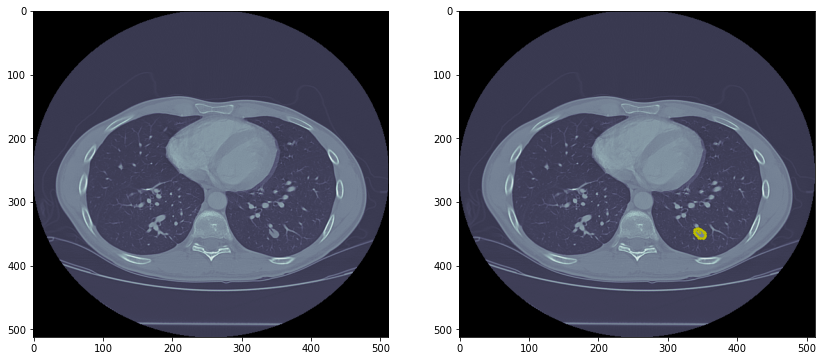

350 357 65
351 356 65
352 355 65
353 354 65
354 353 65
354 352 65
354 351 65
353 350 65
353 349 65
352 348 65
351 347 65
350 346 65
349 345 65
348 345 65
347 344 65
346 343 65
345 343 65
344 342 65
343 342 65
342 342 65
341 342 65
340 343 65
339 344 65
339 345 65
340 346 65
340 347 65
340 348 65
340 349 65
341 350 65
342 351 65
342 352 65
342 353 65
343 354 65
344 355 65
345 356 65
346 356 65
347 357 65
348 357 65
349 357 65
350 357 65
342 341 65
343 342 65
344 342 65
345 342 65
346 343 65
347 344 65
347 345 65
348 345 65
349 345 65
350 346 65
351 347 65
352 348 65
352 349 65
352 350 65
353 350 65
353 351 65
353 352 65
353 353 65
353 354 65
353 355 65
352 356 65
351 357 65
350 357 65
349 357 65
348 357 65
347 357 65
346 356 65
345 355 65
344 354 65
343 354 65
342 353 65
341 352 65
342 351 65
341 350 65
341 349 65
340 348 65
340 347 65
339 346 65
339 345 65
339 344 65
339 343 65
340 342 65
341 342 65
342 341 65
341 341 65
340 342 65
339 343 65
339 344 65
339 345 65
339 346 65
340 347 65

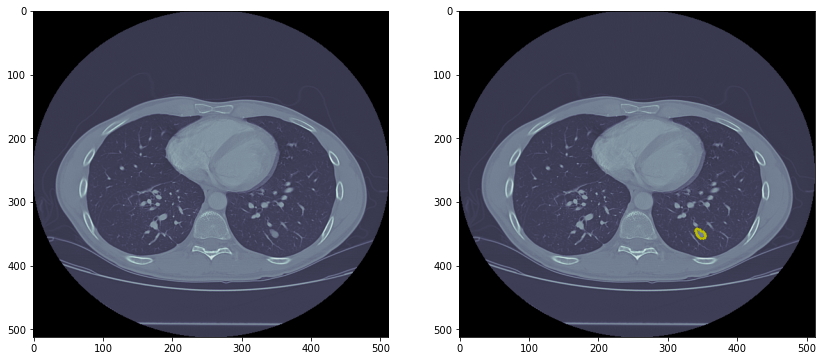

350 356 66
351 355 66
352 354 66
353 353 66
352 352 66
353 351 66
352 350 66
352 349 66
351 348 66
350 348 66
349 347 66
348 346 66
347 346 66
346 346 66
345 346 66
344 346 66
343 347 66
343 348 66
343 349 66
343 350 66
343 351 66
343 352 66
344 353 66
344 354 66
345 355 66
346 355 66
347 356 66
348 356 66
349 356 66
350 356 66
345 344 66
346 345 66
346 346 66
347 346 66
348 347 66
349 348 66
350 348 66
351 349 66
351 350 66
352 351 66
352 352 66
352 353 66
352 354 66
351 355 66
351 356 66
350 356 66
349 356 66
348 356 66
347 356 66
346 356 66
345 355 66
344 354 66
343 353 66
343 352 66
343 351 66
343 350 66
343 349 66
343 348 66
343 347 66
343 346 66
343 345 66
344 344 66
345 344 66
343 346 66
342 347 66
342 348 66
342 349 66
342 350 66
343 351 66
343 352 66
344 353 66
345 354 66
346 355 66
347 355 66
348 355 66
349 354 66
350 353 66
351 352 66
351 351 66
351 350 66
350 349 66
349 349 66
349 348 66
348 347 66
347 347 66
346 347 66
345 346 66
344 346 66
343 346 66


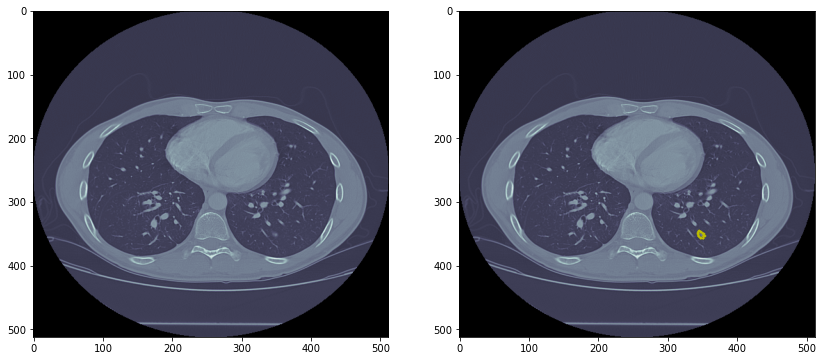

382 364 70
383 363 70
384 362 70
384 361 70
383 360 70
382 359 70
382 358 70
381 358 70
380 357 70
379 357 70
378 358 70
377 358 70
376 359 70
376 360 70
376 361 70
376 362 70
376 363 70
377 364 70
378 364 70
379 364 70
380 364 70
381 364 70
382 364 70
374 360 70
375 359 70
375 358 70
376 358 70
376 357 70
377 357 70
378 357 70
379 357 70
380 357 70
380 356 70
381 357 70
382 357 70
383 358 70
383 359 70
383 360 70
384 361 70
384 362 70
384 363 70
384 364 70
383 365 70
382 366 70
381 366 70
380 366 70
379 366 70
378 366 70
377 366 70
376 365 70
375 364 70
375 363 70
375 362 70
375 361 70
374 360 70
378 356 70
377 357 70
376 357 70
375 358 70
375 359 70
375 360 70
375 361 70
375 362 70
375 363 70
376 364 70
377 364 70
378 365 70
379 365 70
380 365 70
381 364 70
381 363 70
382 363 70
383 363 70
384 362 70
383 361 70
383 360 70
383 359 70
382 358 70
382 357 70
381 356 70
380 356 70
379 356 70
378 356 70
379 363 70
380 362 70
381 362 70
382 362 70
383 361 70
382 360 70
382 359 70
381 358 70

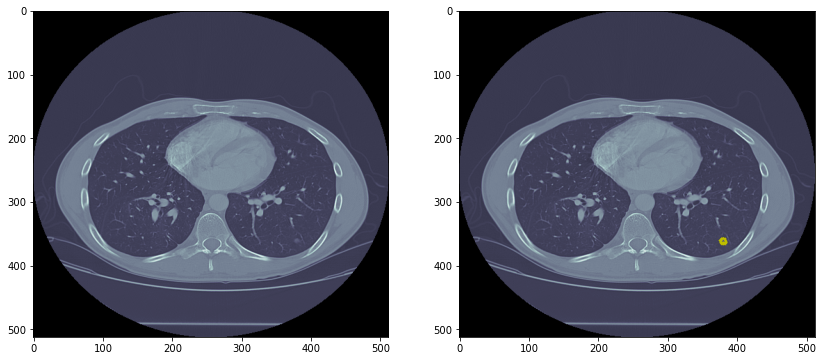

174 216 88
174 217 88
174 218 88
174 219 88


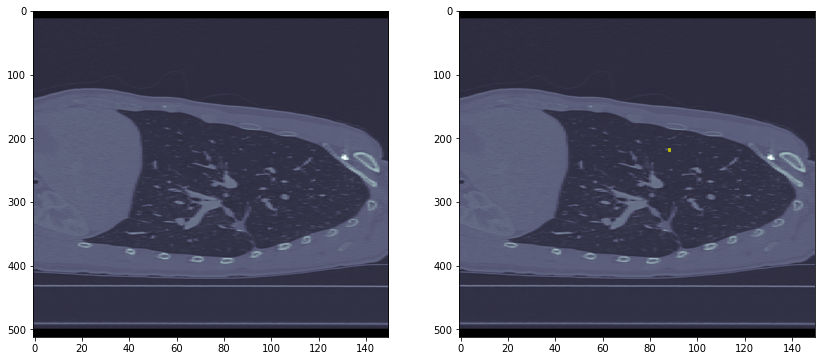

175 214 88
175 215 88
175 220 88


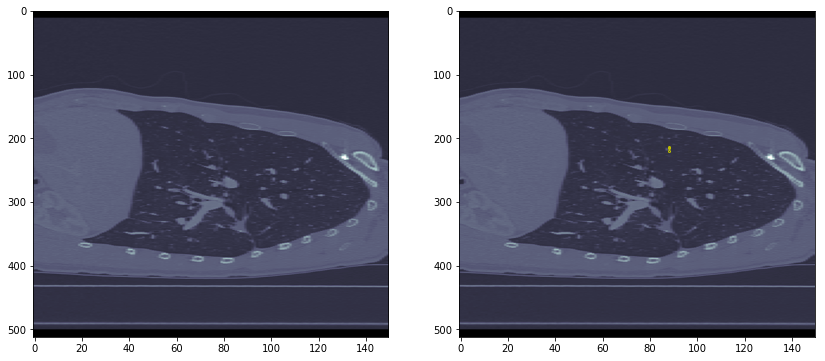

176 213 88
176 221 88


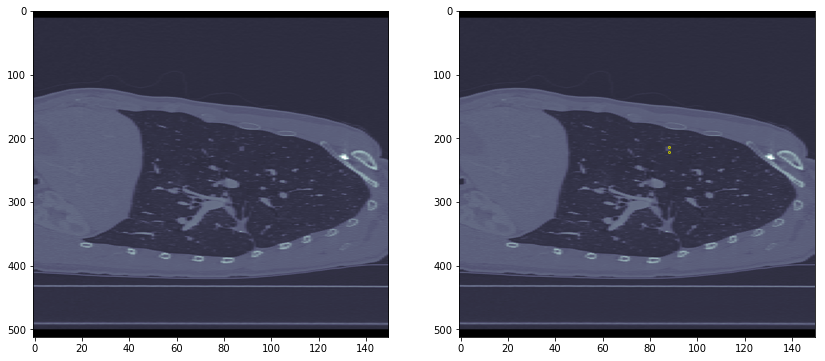

177 213 87
177 214 87
177 215 87
177 216 87
177 217 87
177 218 87
177 212 88
177 221 88
177 212 88


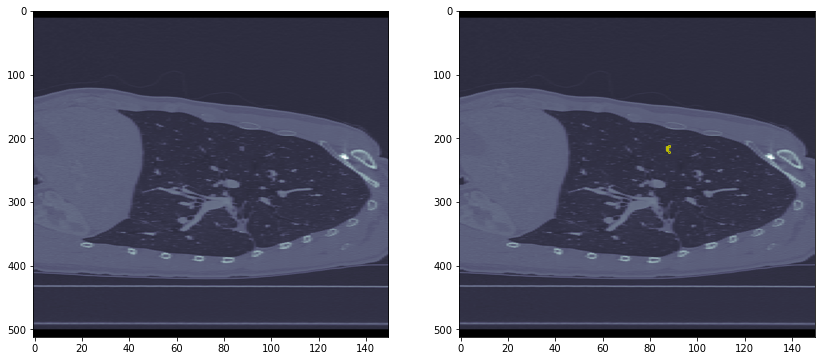

178 212 87
178 219 87
178 212 87
178 222 88
178 212 88
178 218 89
178 219 89
178 220 89
178 221 89
178 222 89


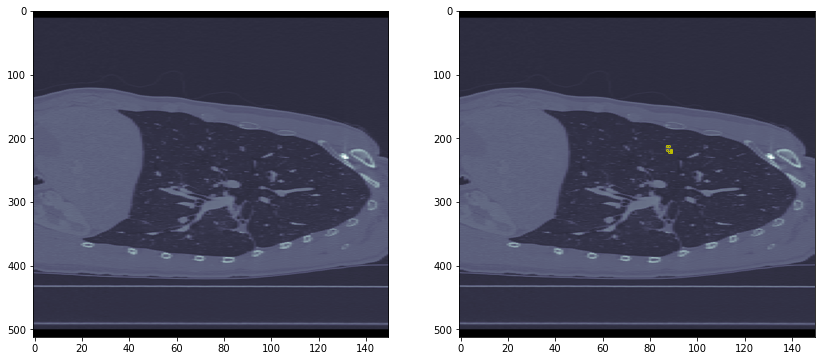

179 219 87
179 212 87
179 223 88
179 212 88
179 217 89
179 223 89
179 223 90
179 224 90
179 225 90


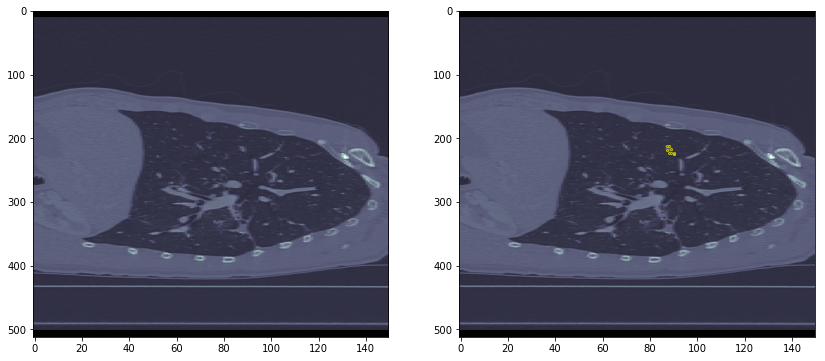

180 219 87
180 212 87
180 223 88
180 212 88
180 217 89
180 224 89
180 222 90
180 226 90


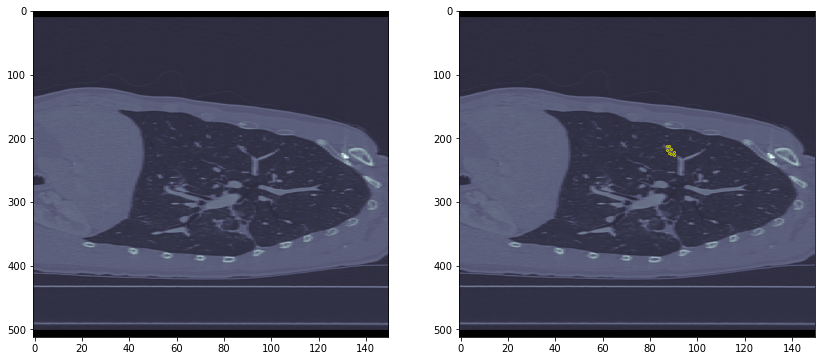

----------------------


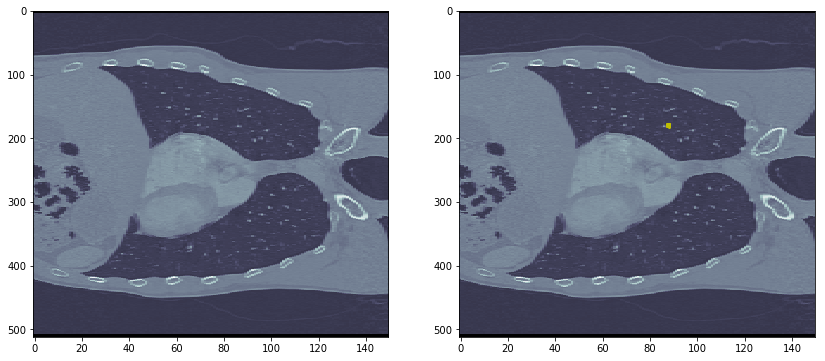

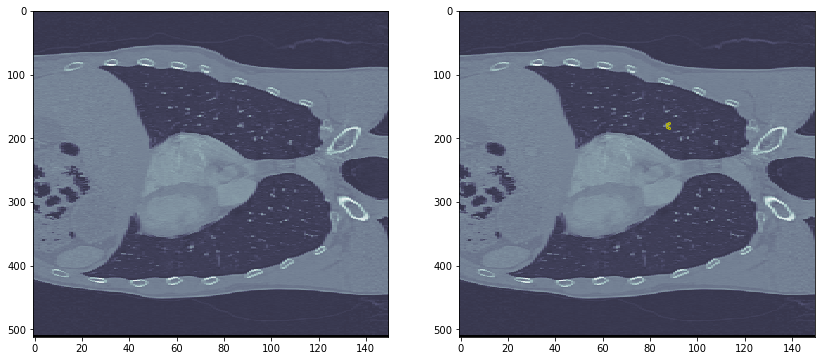

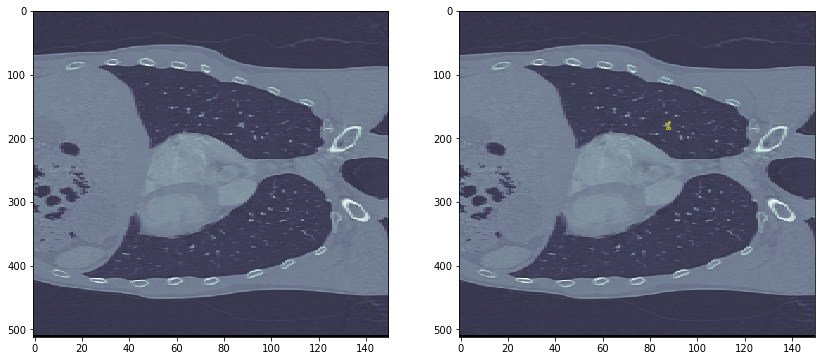

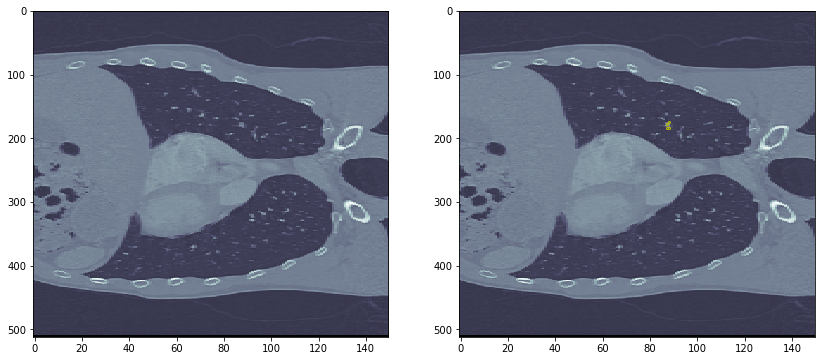

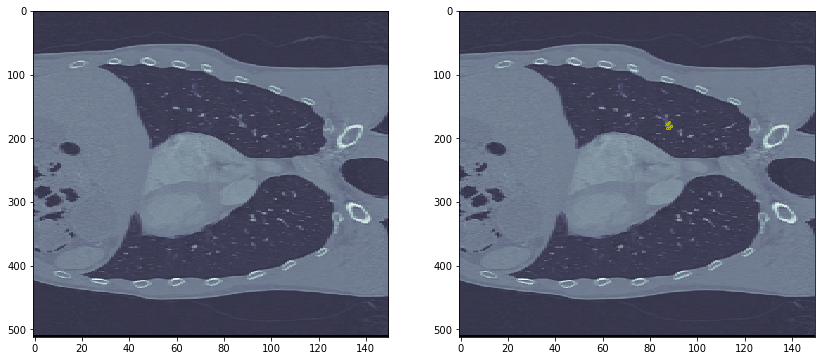

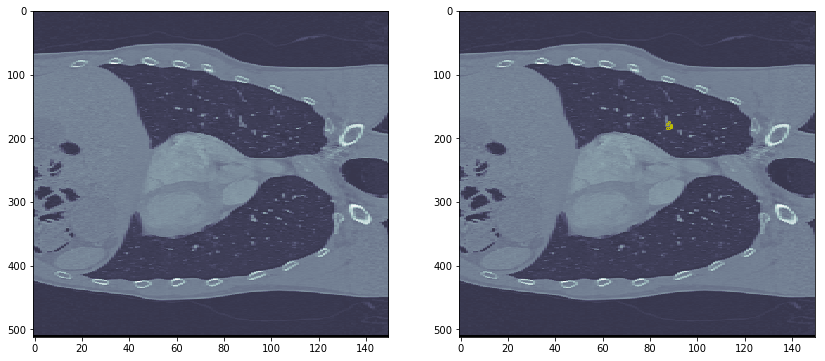

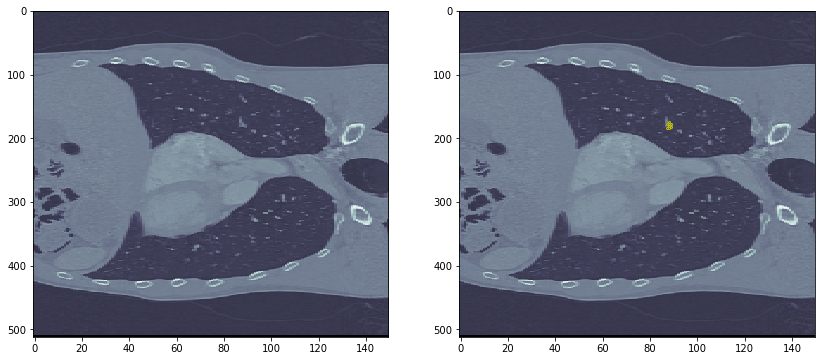

In [6]:
class SegmentationPoint:
    def __init__(self,x,y,z,specialist_index,nodule):
        self.x = x
        self.y = y
        self.z = z
        self.specialist_index = specialist_index
        self.nodule = nodule
        
    def __str__(self):
        return "[{}, {}, {}] - {} - {}".format(self.x,self.y,self.z,self.specialist_index,self.nodule)

def init_array_and_append(dictionary,key,value):
    if key not in dictionary:
        dictionary[key] =[]
    dictionary[key].append(value)
    
class SegmentationPoints:
    def __init__(self):
        self.points = []
        self.by_x = {}
        self.by_y = {}
        self.by_z = {}
    
    def append(self,point):
        self.points.append(point)
        init_array_and_append(self.by_x,point.x,point)
        init_array_and_append(self.by_y,point.y,point)
        init_array_and_append(self.by_z,point.z,point)

    def __str__(self):
        str_accumulate = ""
        for point in self.points:
           str_accumulate += str(point) +"\n"
        return str_accumulate

dictionary_by_location = {}

for i in range (0,len(current_series.dicom_image_paths)):
    ds = current_series.read_dicom_image(i)
    dictionary_by_location[ds.SliceLocation] = ds

ordered_dict = collections.OrderedDict(sorted(dictionary_by_location.items()))
ordered_dict_keys = ordered_dict.keys()

min_value = ordered_dict_keys[0]

ArrayDicom = np.zeros(ConstPixelDims, dtype=RefDs.pixel_array.dtype)
ind = 0
for key, value in ordered_dict.items():
    ArrayDicom[:, :, ind] = value.pixel_array
    ind+=1

points = SegmentationPoints()


for i in range(len(current_series.xml_info.annotations)):
    annotation = current_series.xml_info.annotations[i]
    for nodule in annotation.nodules:
        for roi in nodule.rois:
            for point in roi.roi_xy:
                current_z = int((roi.z - min_value) / ds.SliceThickness )
                points.append(SegmentationPoint(point[0],point[1],current_z,i,nodule.id))

#print points
print ArrayDicom.shape

i = 0
for key, seg_points in points.by_z.items():
    #if(89 <key and key<100):
    if(True):
        current_img = ArrayDicom[:,:,key]
        #print current_img.shape

        fig, ax = plt.subplots(1,2,figsize=(14, 6))
        ax[0].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')
        
        ax[1].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')

        #print "z",key

        rois_x = []
        rois_y = []
        for point in seg_points:
            #print point.x ,point.y ,point.z
            rois_x.append(point.x)
            rois_y.append(point.y)
        ax[1].plot(rois_x,rois_y, 'ro',  markersize=0.5, markerfacecolor='none', markeredgecolor='y')

        plt.show()
        i+=1
        if(i>6):
            break


i = 0
for key, seg_points in points.by_x.items():
    #if(330 <key and key<360) or (250 <key and key<270):
    if(True):
        current_img = ArrayDicom[:,key,:]

        fig, ax = plt.subplots(1,2,figsize=(14, 6))
        ax[0].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')
        ax[1].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')

        rois_x = []
        rois_y = []
        for point in seg_points:
            #print point.x ,point.y ,point.z
            rois_x.append(point.z)
            rois_y.append(point.y)
        ax[1].plot(rois_x,rois_y, 'ro',  markersize=2, markerfacecolor='none', markeredgecolor='y')

        plt.show()
        i+=1
        if(i>6):
            break

        
print "----------------------"
i = 0
for key, seg_points in points.by_y.items():
    #if(330 <key and key<360) or (250 <key and key<270):
    if(True):
        #why "y" we need to fix the first position?
        current_img = ArrayDicom[key,:,:]
        #print current_img.shape
        
        fig, ax = plt.subplots(1,2,figsize=(14, 6))
        ax[0].imshow(current_img, cmap=plt.cm.bone, aspect='auto')

        ax[1].imshow(current_img, cmap=plt.cm.bone, aspect='auto')

        rois_x = []
        rois_y = []
        for point in seg_points:
            #print point.x, point.y, point.z
            rois_x.append(point.z)
            rois_y.append(point.x)
        ax[1].plot(rois_x,rois_y, 'ro',  markersize=2, markerfacecolor='none', markeredgecolor='y')

        plt.show()
        i+=1
        if(i>6):
            break


## Testing 3D algorithm

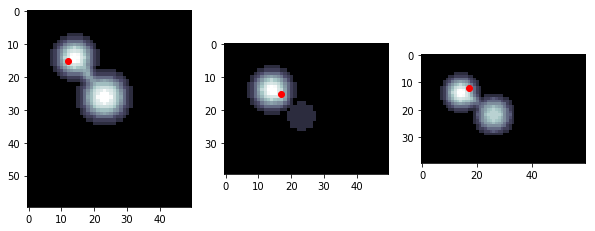

In [7]:
# Generate an initial image with two overlapping circles
x, y, z = np.indices((40, 60, 50))
x1, y1, z1, x2, y2, z2, x3, y3, z3 = 14, 14, 14, 22, 26, 23, 27, 32, 22
r1, r2, r3 = 8, 10, 5
mask_circle1 = (x - x1)**2 + (y - y1)**2 + (z - z1)**2 < r1**2
mask_circle2 = (x - x2)**2 + (y - y2)**2 + (z - z2)**2 < r2**2
mask_circle3 = (x - x3)**2 + (y - y3)**2 + (z - z3)**2 < r3**2
image = np.logical_or(mask_circle1, mask_circle2, mask_circle3)

# Now we want to separate the two objects in image
# Generate the markers as local maxima of the distance to the background
distance_image = ndi.distance_transform_edt(image)

p = (17,12,15)

fig, ax = plt.subplots(1,3,figsize=(10,4))
ax[0].imshow(distance_image[17,:,:], cmap=plt.cm.bone)
ax[0].plot(p[1],p[2],'o', linewidth=2,color='red')
ax[1].imshow(distance_image[:,17,:], cmap=plt.cm.bone)
ax[1].plot(p[0],p[2],'o', linewidth=2,color='red')
ax[2].imshow(distance_image[:,:,17], cmap=plt.cm.bone)
ax[2].plot(p[0],p[1],'o', linewidth=2,color='red')
plt.show()



[10.0, 8.0, 6.0, 4.0, 2.0, 0.0]
(40, 50, 30)
one image
one image
one image
one image
one image
one image
1 1 1
22 26 23


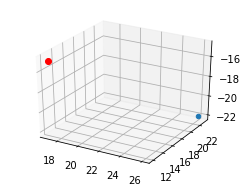

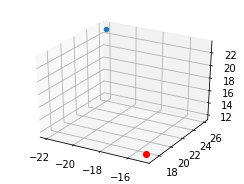

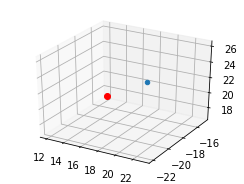

42 42 42
14 14 14


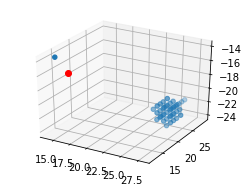

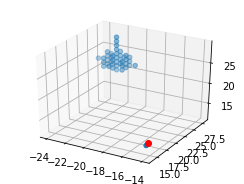

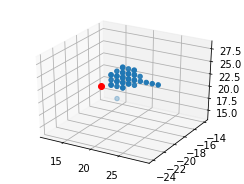

380 380 380
12 14 14


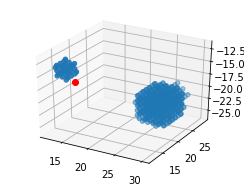

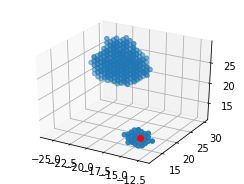

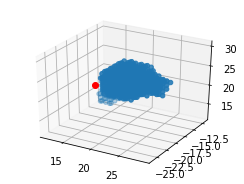

1455 1455 1455
10 13 13


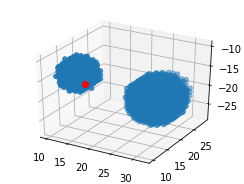

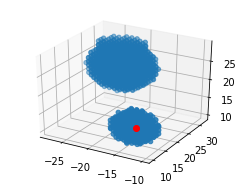

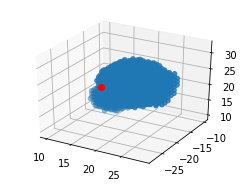

3620 3620 3620
8 12 13


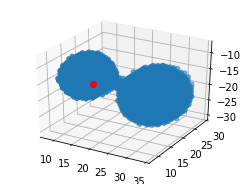

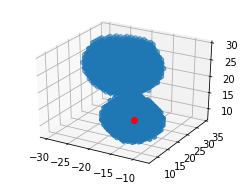

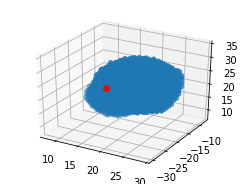

60000 60000 60000
0 0 0


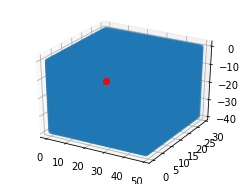

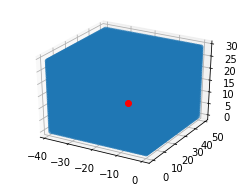

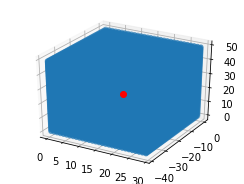

In [8]:
# Generate an initial image with two overlapping circles
x, y, z = np.indices((40, 50, 30))
x1, y1, z1, x2, y2, z2, x3, y3, z3 = 14, 14, 14, 22, 26, 23, 27, 32, 22
r1, r2, r3 = 8, 10, 5
mask_circle1 = (x - x1)**2 + (y - y1)**2 + (z - z1)**2 < r1**2
mask_circle2 = (x - x2)**2 + (y - y2)**2 + (z - z2)**2 < r2**2
mask_circle3 = (x - x3)**2 + (y - y3)**2 + (z - z3)**2 < r3**2
image = np.logical_or(mask_circle1, mask_circle2, mask_circle3)

# Now we want to separate the two objects in image
# Generate the markers as local maxima of the distance to the background
distance_image = ndi.distance_transform_edt(image)

def get_equal_step_levels(image, level_count=5):
    pyramid_levels = []
    max_value = np.max(image)
    min_value = np.min(image)
    step = (max_value - min_value) / float(level_count)
    current_value = max_value
    while current_value >= min_value:
        pyramid_levels.append(current_value)
        current_value=current_value - step
    return pyramid_levels

def get_watershed_pyramid(source_image, levels):
    print levels
    watershed_pyramid = []
    
    print source_image.shape
    i_size = source_image.shape[0]
    j_size = source_image.shape[1]
    k_size = source_image.shape[2]
    
    for level in levels:
        result_image = np.where(source_image >= level,1,0)
        watershed_pyramid.append(result_image)
        
        print "one image"
        
    return watershed_pyramid

def get_min_pyramid_level(watershed_pyramid, point):
    for level in range(len(watershed_pyramid)-1,-1,-1):
        if watershed_pyramid[level][point] == 0:
            return level
    return None

watershed_pyramid = get_watershed_pyramid(distance_image, get_equal_step_levels(distance_image))
    
from mpl_toolkits.mplot3d import Axes3D

for image in watershed_pyramid:
    fig = plt.figure(figsize=(4,3))
    z,x,y = image.nonzero()
    print len(z),len(x),len(y) 
    print z[0],x[0],y[0]
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x, y, -z, zdir='z')
    ax.plot([p[0]], [p[1]], [-p[2]],'o', linewidth=2,color='red')

    plt.show()
    
    fig = plt.figure(figsize=(4,3))

    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(-z, x, y , zdir='z')
    ax.plot([-p[2]], [p[0]], [p[1]],'o', linewidth=2,color='red')

    plt.show()
    
    
    fig = plt.figure(figsize=(4,3))

    ax = fig.add_subplot(111, projection='3d')
    ax.scatter( y, -z, x,zdir='z')
    ax.plot([p[1]], [-p[2]], [p[0]],'o', linewidth=2,color='red')

    plt.show()

[10.0, 8.0, 6.0, 4.0, 2.0, 0.0]
(40, 60, 50)
one image
one image
one image
one image
one image
one image
2


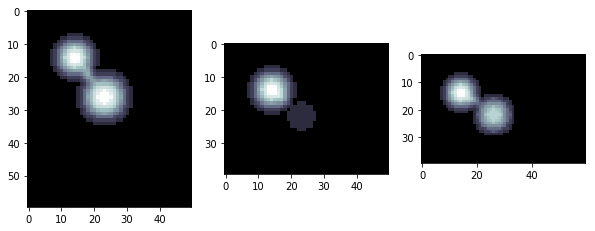

3


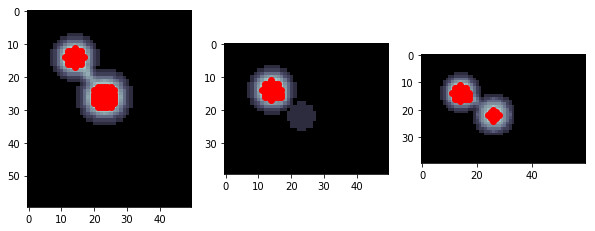

4


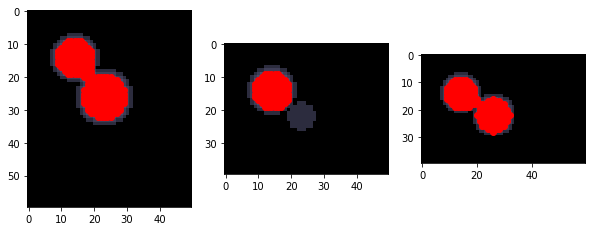

5


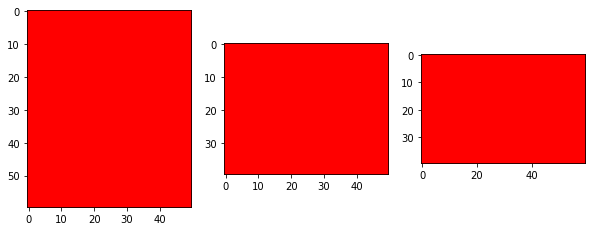

In [9]:
# Generate an initial image with two overlapping circles
x, y, z = np.indices((40, 60, 50))
x1, y1, z1, x2, y2, z2, x3, y3, z3 = 14, 14, 14, 22, 26, 23, 27, 32, 22
r1, r2, r3 = 8, 10, 5
mask_circle1 = (x - x1)**2 + (y - y1)**2 + (z - z1)**2 < r1**2
mask_circle2 = (x - x2)**2 + (y - y2)**2 + (z - z2)**2 < r2**2
mask_circle3 = (x - x3)**2 + (y - y3)**2 + (z - z3)**2 < r3**2
image = np.logical_or(mask_circle1, mask_circle2, mask_circle3)

# Now we want to separate the two objects in image
# Generate the markers as local maxima of the distance to the background
distance_image = ndi.distance_transform_edt(image)

user_point = (17,12,15)

test_watershed_pyramid = get_watershed_pyramid(distance_image, get_equal_step_levels(distance_image))
    
test_min_pyramid_level = get_min_pyramid_level(test_watershed_pyramid, user_point)

for i in range(test_min_pyramid_level,len(test_watershed_pyramid)):
    print i

    level_image = test_watershed_pyramid[i]

    fig, ax = plt.subplots(1,3,figsize=(10,4))
    ax[0].imshow(distance_image[17,:,:], cmap=plt.cm.bone)

    y,x=level_image[17,:,:].nonzero()
    ax[0].plot(x,y,'o', linewidth=2,color='red')

    ax[1].imshow(distance_image[:,17,:], cmap=plt.cm.bone)

    y,x=level_image[:,17,:].nonzero()
    ax[1].plot(x,y,'o', linewidth=2,color='red')

    ax[2].imshow(distance_image[:,:,17], cmap=plt.cm.bone)

    y,x=level_image[:,:,17].nonzero()
    ax[2].plot(x,y,'o', linewidth=2,color='red')
    plt.show()



## Apply to medical imaging

In [10]:
first_image_path = current_series.dicom_image_paths[0]
RefDs = dicom.read_file(first_image_path)
len_lstFilesDCM = len(current_series.dicom_image_paths)
ConstPixelDims = (int(RefDs.Rows), int(RefDs.Columns), len_lstFilesDCM)
ConstPixelSpacing = (float(RefDs.PixelSpacing[0]), float(RefDs.PixelSpacing[1]), float(RefDs.SliceThickness))

x = np.arange(0.0, (ConstPixelDims[0]+1)*ConstPixelSpacing[0], ConstPixelSpacing[0])
y = np.arange(0.0, (ConstPixelDims[1]+1)*ConstPixelSpacing[1], ConstPixelSpacing[1])
z = np.arange(0.0, (ConstPixelDims[2]+1)*ConstPixelSpacing[2], ConstPixelSpacing[2])

dictionary_by_location = {}

for i in range (0,len(current_series.dicom_image_paths)):
    ds = current_series.read_dicom_image(i)
    dictionary_by_location[ds.SliceLocation] = ds

ordered_dict = collections.OrderedDict(sorted(dictionary_by_location.items()))

ArrayDicom = np.zeros(ConstPixelDims, dtype=RefDs.pixel_array.dtype)
ind = 0
for key, value in ordered_dict.items():
    ArrayDicom[:, :, ind] = value.pixel_array
    ind+=1

image_3d = ArrayDicom
    
levels = get_equal_step_levels(image_3d,10)

watershed_pyramid = get_watershed_pyramid(image_3d, levels)

print "Result"

# USING A LOT OF MEMORY. REVIEW IT
#for image in watershed_pyramid:
#    fig = plt.figure(figsize=(8,6))
#    z,x,y = image.nonzero()
#    ax = fig.add_subplot(111, projection='3d')
#    ax.scatter(x, y, -z, zdir='z', cmap=plt.cm.bone)

#    plt.show()


[4095, 3583.0999999999999, 3071.1999999999998, 2559.2999999999997, 2047.3999999999996, 1535.4999999999995, 1023.5999999999996, 511.69999999999959, -0.20000000000038654, -512.10000000000036]
(512, 512, 150)
one image
one image
one image
one image
one image
one image
one image
one image
one image
one image
Result


## User select one point


In [11]:
#user_point = (157, 189, 127)

#min_pyramid_level = get_min_pyramid_level(watershed_pyramid, user_point)

#print min_pyramid_level

#image = watershed_pyramid[6]
#fig = plt.figure(figsize=(8,6))
#z,x,y = image.nonzero()
#print len(z),len(x),len(y) 
#z =z[0:2500000]
#x =x[0:2500000]
#y =y[0:2500000] 
#ax = fig.add_subplot(111, projection='3d')
#ax.scatter(x, y, -z, zdir='z', cmap=plt.cm.bone)
#ax.plot([user_point[0]], [user_point[1]], [-user_point[2]],'o', linewidth=2,color='red')


#plt.show()


1067
[1279.549999999997, 1228.3599999999969, 1177.1699999999969, 1125.9799999999968, 1074.7899999999968, 1023.5999999999967, 972.40999999999667, 921.21999999999662, 870.02999999999656, 818.83999999999651]
(512, 512, 150)
one image
one image
one image
one image
one image
one image
one image
one image
one image
one image


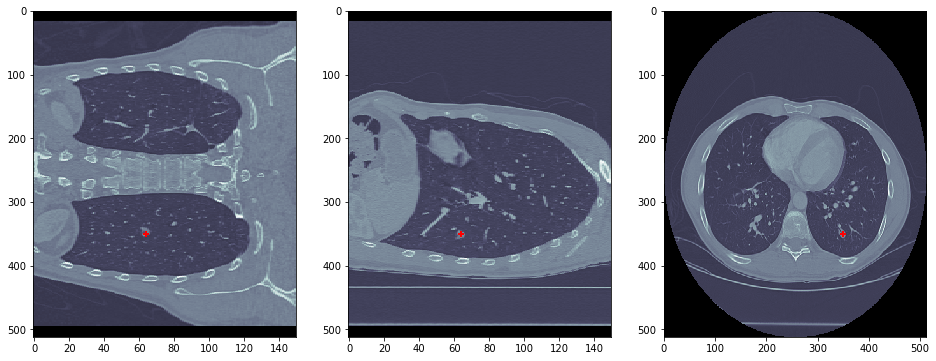

4


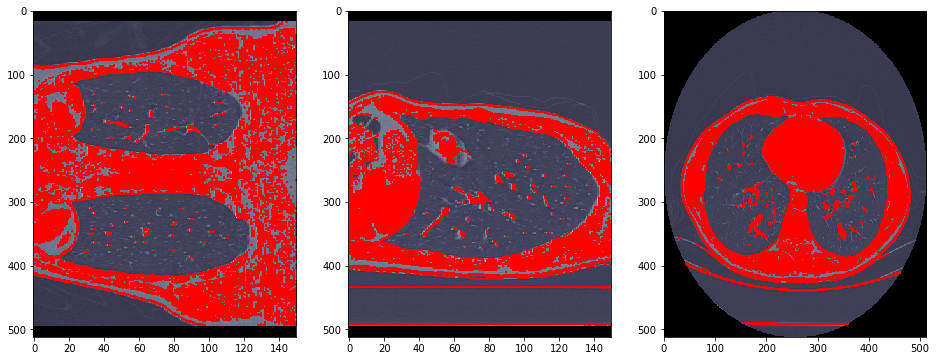

4


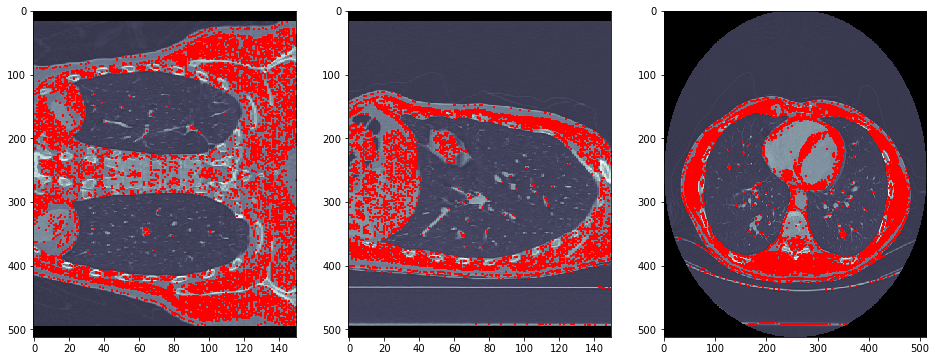

5


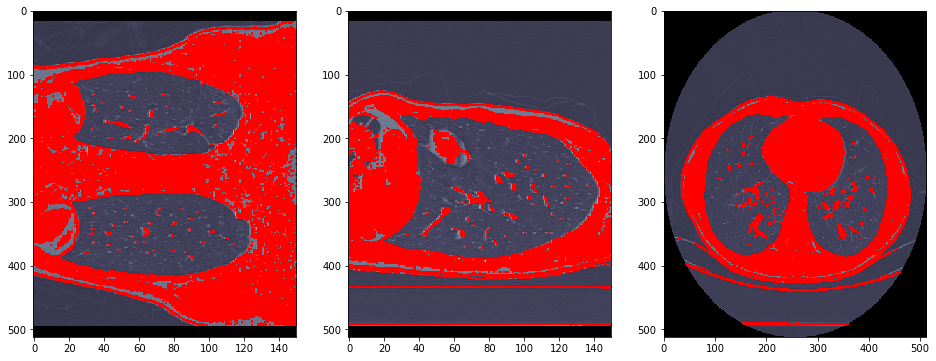

5


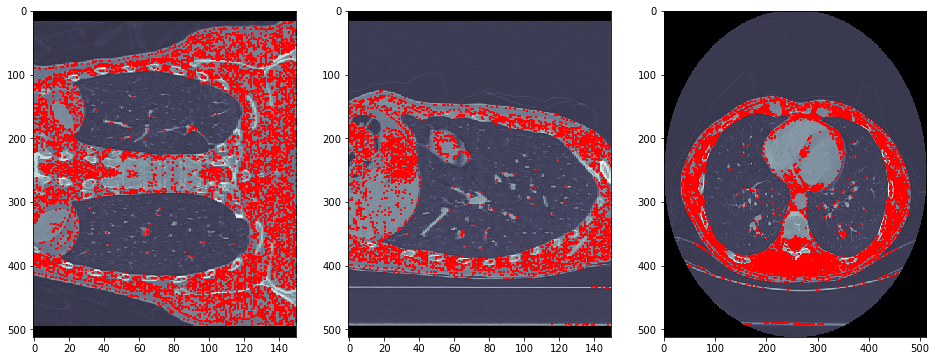

6


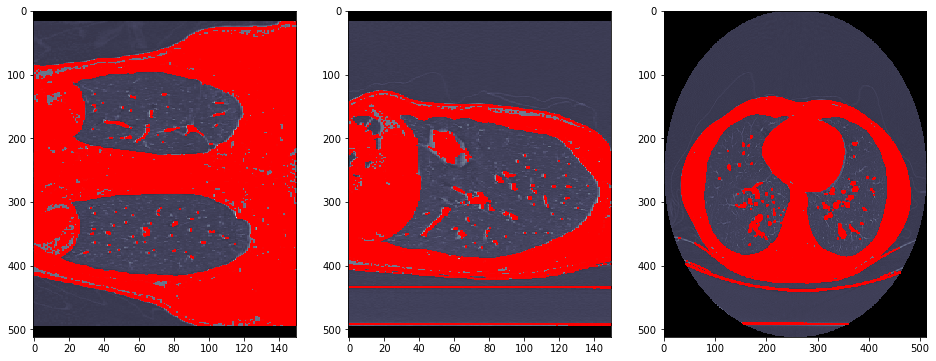

6


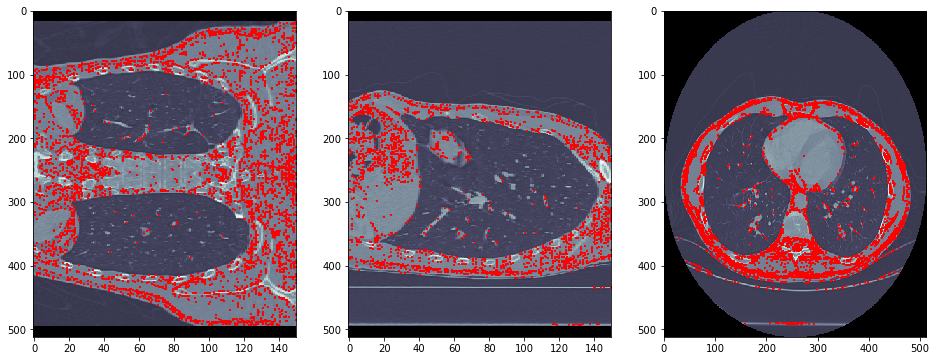

7


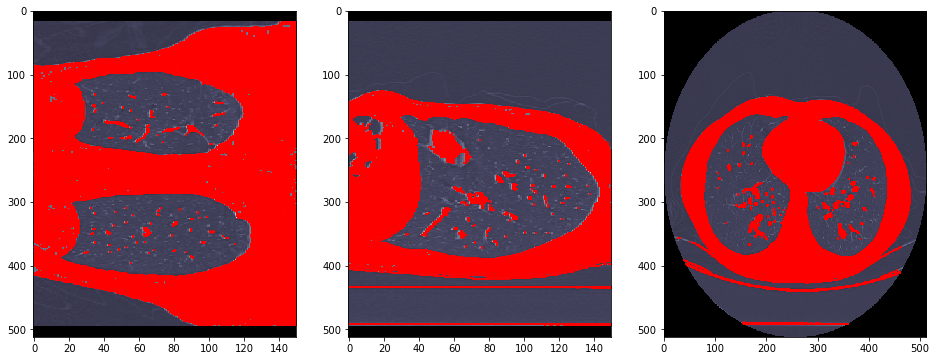

7


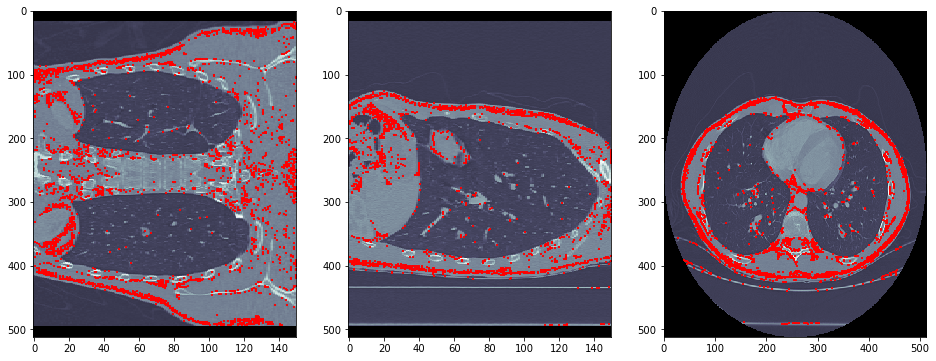

8


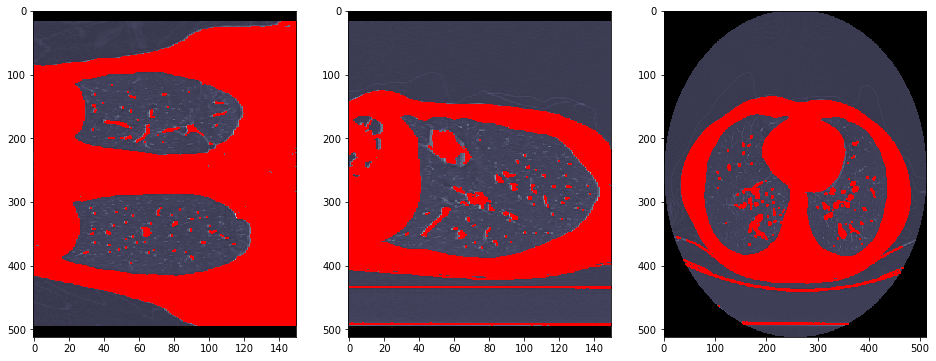

8


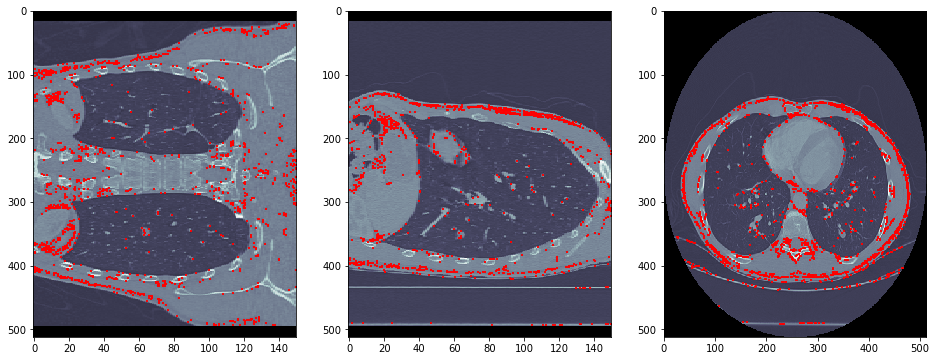

9


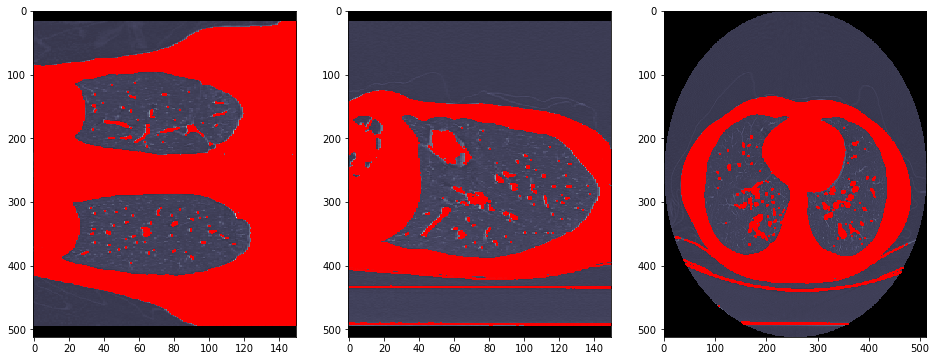

9


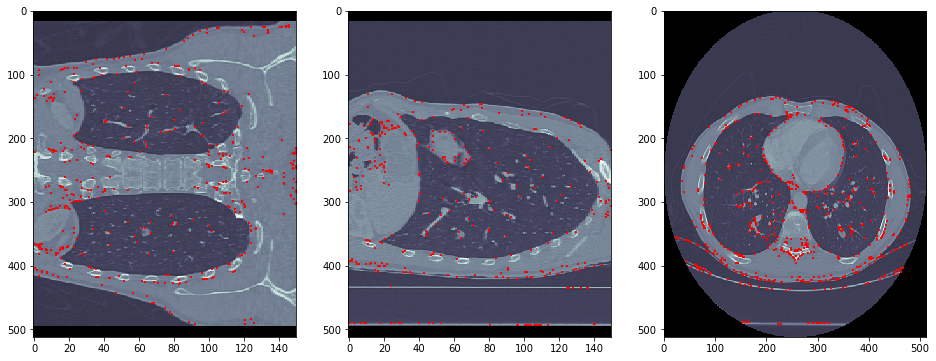

In [12]:
first_image_path = current_series.dicom_image_paths[0]
RefDs = dicom.read_file(first_image_path)
len_lstFilesDCM = len(current_series.dicom_image_paths)
ConstPixelDims = (int(RefDs.Rows), int(RefDs.Columns), len_lstFilesDCM)
ConstPixelSpacing = (float(RefDs.PixelSpacing[0]), float(RefDs.PixelSpacing[1]), float(RefDs.SliceThickness))

x = np.arange(0.0, (ConstPixelDims[0]+1)*ConstPixelSpacing[0], ConstPixelSpacing[0])
y = np.arange(0.0, (ConstPixelDims[1]+1)*ConstPixelSpacing[1], ConstPixelSpacing[1])
z = np.arange(0.0, (ConstPixelDims[2]+1)*ConstPixelSpacing[2], ConstPixelSpacing[2])

dictionary_by_location = {}

for i in range (0,len(current_series.dicom_image_paths)):
    ds = current_series.read_dicom_image(i)
    dictionary_by_location[ds.SliceLocation] = ds

ordered_dict = collections.OrderedDict(sorted(dictionary_by_location.items()))

ArrayDicom = np.zeros(ConstPixelDims, dtype=RefDs.pixel_array.dtype)
ind = 0
for key, value in ordered_dict.items():
    ArrayDicom[:, :, ind] = value.pixel_array
    ind+=1

image_3d = ArrayDicom



user_point = (350,350,64)

print image_3d[user_point]

levels = get_equal_step_levels(image_3d,100)[55:65]

watershed_pyramid = get_watershed_pyramid(image_3d, levels)

min_pyramid_level = get_min_pyramid_level(watershed_pyramid, user_point)

#------------
#level_image = watershed_pyramid[i]

fig, ax = plt.subplots(1,3,figsize=(16,6))
ax[0].imshow(image_3d[user_point[0],:,:], cmap=plt.cm.bone, aspect='auto')
ax[0].plot(user_point[2],user_point[0],'+', mew=2,color='red')

ax[1].imshow(image_3d[:,user_point[1],:], cmap=plt.cm.bone, aspect='auto')
ax[1].plot(user_point[2],user_point[1],'+', mew=2,color='red')

ax[2].imshow(image_3d[:,:,user_point[2]], cmap=plt.cm.bone, aspect='auto')
ax[2].plot(user_point[0],user_point[1],'+', mew=2,color='red')


plt.show()
#------------

for i in range(min_pyramid_level,len(watershed_pyramid)):
    print i

    level_image = watershed_pyramid[i]

    fig, ax = plt.subplots(1,3,figsize=(16,6))
    ax[0].imshow(image_3d[user_point[0],:,:], cmap=plt.cm.bone, aspect='auto')
    y,x=level_image[user_point[0],:,:].nonzero()
    #ax[0].plot(x,y,lot mew=1,color='red')
    ax[0].scatter(x,y,color='red',marker=',',lw=1, s=1)

    ax[1].imshow(image_3d[:,user_point[1],:], cmap=plt.cm.bone, aspect='auto')
    y,x=level_image[:,user_point[1],:].nonzero()
    ax[1].scatter(x,y,color='red',marker=',',lw=1, s=1)
    
    ax[2].imshow(image_3d[:,:,user_point[2]], cmap=plt.cm.bone, aspect='auto')
    y,x=level_image[:,:,user_point[2]].nonzero()
    ax[2].scatter(x,y,color='red',marker=',',lw=1, s=1)
    
    plt.show()
    
    print i

    level_image = watershed_pyramid[i] - watershed_pyramid[i-1]

    fig, ax = plt.subplots(1,3,figsize=(16,6))
    ax[0].imshow(image_3d[user_point[0],:,:], cmap=plt.cm.bone, aspect='auto')
    y,x=level_image[user_point[0],:,:].nonzero()
    ax[0].scatter(x,y,color='red',marker=',',lw=1, s=1)

    ax[1].imshow(image_3d[:,user_point[1],:], cmap=plt.cm.bone, aspect='auto')
    y,x=level_image[:,user_point[1],:].nonzero()
    ax[1].scatter(x,y,color='red',marker=',',lw=1, s=1)

    ax[2].imshow(image_3d[:,:,user_point[2]], cmap=plt.cm.bone, aspect='auto')
    y,x=level_image[:,:,user_point[2]].nonzero()
    ax[2].scatter(x,y,color='red',marker=',',lw=1, s=1)
                    
    plt.show()



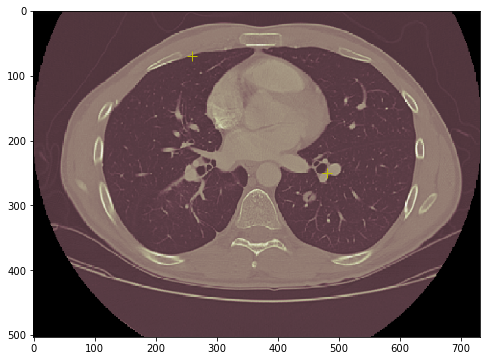

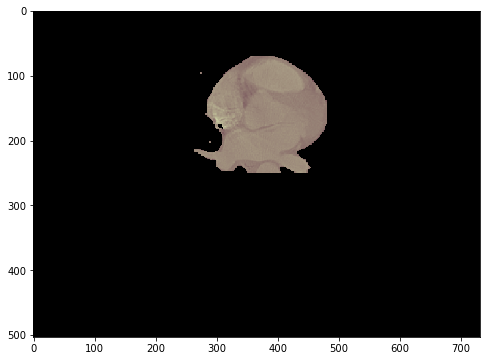

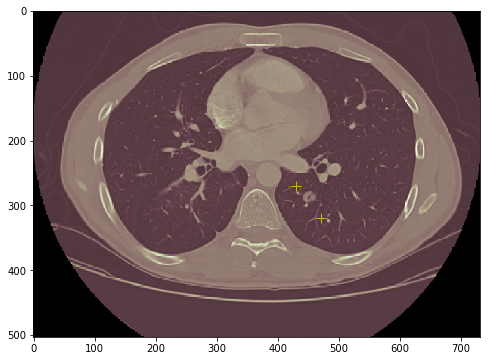

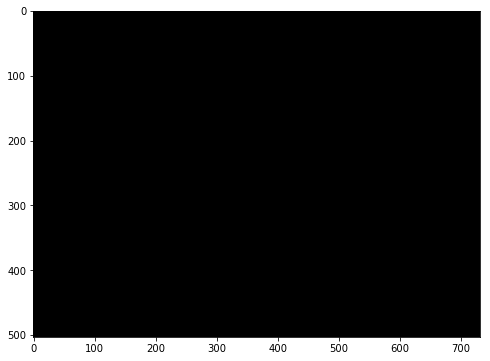

In [13]:
import cv2


img = cv2.imread('Selection_001.png')
mask = np.zeros(img.shape[:2],np.uint8)

bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)

start_x=260
start_y=70
width=220
height=180

rect = (start_x,start_y,width,height)

fig, ax = plt.subplots(figsize=(8,6))
ax.imshow(img, cmap=plt.cm.bone, aspect='auto')
ax.plot([start_x,start_x+width],[start_y,start_y+height], 'r+',  markersize=10, markerfacecolor='none', markeredgecolor='y')
plt.show()

cv2.grabCut(img,mask,rect,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_RECT)
mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
img = img*mask2[:,:,np.newaxis]


fig, ax = plt.subplots(figsize=(8,6))
ax.imshow(img, cmap=plt.cm.bone, aspect='auto')
plt.show()


#######
img = cv2.imread('Selection_001.png')
mask = np.zeros(img.shape[:2],np.uint8)

bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)

start_x=430
start_y=270
width=40
height=50

rect = (start_x,start_y,width,height)

fig, ax = plt.subplots(figsize=(8,6))
ax.imshow(img, cmap=plt.cm.bone, aspect='auto')
ax.plot([start_x,start_x+width],[start_y,start_y+height], 'r+',  markersize=10, markerfacecolor='none', markeredgecolor='y')
plt.show()

cv2.grabCut(img,mask,rect,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_RECT)
mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
img = img*mask2[:,:,np.newaxis]


fig, ax = plt.subplots(figsize=(8,6))
ax.imshow(img, cmap=plt.cm.bone, aspect='auto')
plt.show()
